In [1]:
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
from scipy.ndimage.filters import gaussian_filter1d
import sqlite3 as sql
import os
import pandas as pd
from datetime import datetime
from glob import glob
import PlaceCellAnalysis as pc

os.sys.path.append('../')
import utilities as u
import preprocessing as pp
import behavior as b
import BayesianDecoding as bd


%load_ext autoreload
%autoreload 2

%matplotlib inline

In [4]:
# load session
mouse = '4139219.2'
df = pp.load_session_db()


#df = df[df['RewardCount']>30]
df = df[df['Imaging']==1]
df = df.sort_values(['MouseName','DateTime','SessionNumber'])

df_mouse = df[df['MouseName'].str.match(mouse)]
df_mouse = df_mouse[df_mouse['Track'].str.match('TwoTower_noTimeout') | df_mouse['Track'].str.match('TwoTower_Timeout')]
df_mouse

,MouseName,DateFolder,SessionNumber,Track,RewardCount,Imaging,ImagingRegion,DateTime,data file,scanfile,scanmat
624,4139219.2,08_10_2018,1,TwoTower_noTimeout,63,1,CA1,2018-10-08,G:\My Drive\\VR_Data\TwoTower\4139219.2\08_10_...,G:\My Drive\2P_Data\TwoTower\4139219.2\08_10_2...,G:\My Drive\2P_Data\TwoTower\4139219.2\08_10_2...
626,4139219.2,08_10_2018,3,TwoTower_noTimeout,29,1,CA1,2018-10-08,G:\My Drive\\VR_Data\TwoTower\4139219.2\08_10_...,G:\My Drive\2P_Data\TwoTower\4139219.2\08_10_2...,G:\My Drive\2P_Data\TwoTower\4139219.2\08_10_2...
664,4139219.2,10_10_2018,2,TwoTower_noTimeout,86,1,CA1,2018-10-10,G:\My Drive\\VR_Data\TwoTower\4139219.2\10_10_...,G:\My Drive\2P_Data\TwoTower\4139219.2\10_10_2...,G:\My Drive\2P_Data\TwoTower\4139219.2\10_10_2...
702,4139219.2,12_10_2018,1,TwoTower_Timeout,54,1,CA1,2018-10-12,G:\My Drive\\VR_Data\TwoTower\4139219.2\12_10_...,G:\My Drive\2P_Data\TwoTower\4139219.2\12_10_2...,G:\My Drive\2P_Data\TwoTower\4139219.2\12_10_2...
748,4139219.2,15_10_2018,2,TwoTower_Timeout,54,1,CA1,2018-10-15,G:\My Drive\\VR_Data\TwoTower\4139219.2\15_10_...,G:\My Drive\2P_Data\TwoTower\4139219.2\15_10_2...,G:\My Drive\2P_Data\TwoTower\4139219.2\15_10_2...
797,4139219.2,17_10_2018,6,TwoTower_Timeout,53,1,CA1,2018-10-17,G:\My Drive\\VR_Data\TwoTower\4139219.2\17_10_...,G:\My Drive\2P_Data\TwoTower\4139219.2\17_10_2...,G:\My Drive\2P_Data\TwoTower\4139219.2\17_10_2...
836,4139219.2,19_10_2018,1,TwoTower_Timeout,38,1,CA1,2018-10-19,G:\My Drive\\VR_Data\TwoTower\4139219.2\19_10_...,G:\My Drive\2P_Data\TwoTower\4139219.2\19_10_2...,G:\My Drive\2P_Data\TwoTower\4139219.2\19_10_2...
838,4139219.2,19_10_2018,3,TwoTower_Timeout,47,1,CA1,2018-10-19,G:\My Drive\\VR_Data\TwoTower\4139219.2\19_10_...,G:\My Drive\2P_Data\TwoTower\4139219.2\19_10_2...,G:\My Drive\2P_Data\TwoTower\4139219.2\19_10_2...
853,4139219.2,20_10_2018,3,TwoTower_Timeout,52,1,CA1,2018-10-20,G:\My Drive\\VR_Data\TwoTower\4139219.2\20_10_...,G:\My Drive\2P_Data\TwoTower\4139219.2\20_10_2...,G:\My Drive\2P_Data\TwoTower\4139219.2\20_10_2...
871,4139219.2,22_10_2018,2,TwoTower_Timeout,51,1,CA1,2018-10-22,G:\My Drive\\VR_Data\TwoTower\4139219.2\22_10_...,G:\My Drive\2P_Data\TwoTower\4139219.2\22_10_2...,G:\My Drive\2P_Data\TwoTower\4139219.2\22_10_2...


C:\Users\mplitt\Anaconda3\lib\site-packages\pandas\core\frame.py:3790: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)
C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:257: RuntimeWarning: Mean of empty slice
  zone1_speed[i] = np.nanmean(sub_frame.loc[zone1_mask,'speed'])
C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:256: RuntimeWarning: Mean of empty slice
  zone0_speed[i]=np.nanmean(sub_frame.loc[zone0_mask,'speed'])


((<Figure size 360x360 with 1 Axes>,
  <matplotlib.axes._subplots.AxesSubplot at 0x26e4c6ecdd8>),
 (<Figure size 360x360 with 1 Axes>,
  <matplotlib.axes._subplots.AxesSubplot at 0x26e4c6c4e48>),
 (<Figure size 360x360 with 1 Axes>,
  <matplotlib.axes._subplots.AxesSubplot at 0x26e4eb32ef0>))

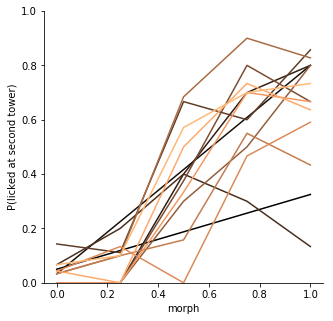

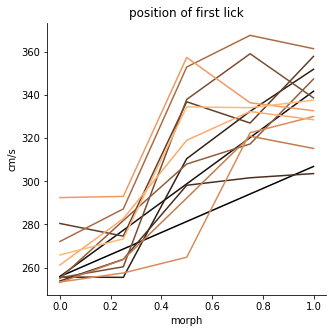

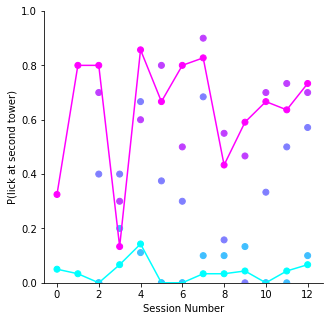

In [5]:
data = pp.behavior_dataframe([df_mouse['data file'].iloc[i] for i in range(3,df_mouse.shape[0],1)],concat=False)
b.learning_curve_plots(data)

In [22]:
VRDat,C,Cd, S, A = pp.load_scan_sess(df_mouse.iloc[6])
trial_info, tstart_inds, teleport_inds = u.by_trial_info(VRDat)
C_trial_mat, occ_trial_mat, edges,centers = u.make_pos_bin_trial_matrices(C,VRDat['pos']._values,VRDat['tstart']._values,VRDat['teleport']._values)

G:\My Drive\2P_Data\TwoTower\4139224.3\27_10_2018\TwoTower_Timeout\TwoTower_Timeout_004_014.mat


C:\Users\mplitt\MightyMorphingPhotonRangers\preprocessing.py:185: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  frame['ca inds'] = caInds
C:\Users\mplitt\Anaconda3\lib\site-packages\pandas\core\indexing.py:194: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)
C:\Users\mplitt\Anaconda3\lib\site-packages\pandas\core\frame.py:3035: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcas

G:\My Drive\2P_Data\TwoTower\4139224.3\27_10_2018\TwoTower_Timeout\TwoTower_Timeout_004_014.mat
#subsystem#not made into numpy array
frame diff 0


C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:189: RuntimeWarning: Mean of empty slice
  zone1_speed[i] = np.nanmean(sub_frame.loc[zone1_mask,'speed'])


In [23]:
print(trial_info.keys())

dict_keys(['morphs', 'max_pos', 'rewards', 'zone0_licks', 'zone1_licks', 'zone0_speed', 'zone1_speed', 'pcnt', 'wallJitter', 'towerJitter', 'bckgndJitter', 'clickOn', 'pos_lick'])


G:\My Drive\2P_Data\TwoTower\4139224.3\27_10_2018\TwoTower_Timeout\TwoTower_Timeout_004_014.mat


C:\Users\mplitt\MightyMorphingPhotonRangers\preprocessing.py:185: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  frame['ca inds'] = caInds
C:\Users\mplitt\Anaconda3\lib\site-packages\pandas\core\indexing.py:194: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)
C:\Users\mplitt\Anaconda3\lib\site-packages\pandas\core\frame.py:3035: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcas

G:\My Drive\2P_Data\TwoTower\4139224.3\27_10_2018\TwoTower_Timeout\TwoTower_Timeout_004_014.mat
#subsystem#not made into numpy array
frame diff 0


C:\Users\mplitt\MightyMorphingPhotonRangers\utilities.py:189: RuntimeWarning: Mean of empty slice
  zone1_speed[i] = np.nanmean(sub_frame.loc[zone1_mask,'speed'])


processing trial 0


C:\Users\mplitt\MightyMorphingPhotonRangers\BayesianDecoding.py:210: RuntimeWarning: divide by zero encountered in log
  log_tmpnum0 = log_L0 + np.squeeze(np.log(XXZZ0))
C:\Users\mplitt\MightyMorphingPhotonRangers\BayesianDecoding.py:217: RuntimeWarning: divide by zero encountered in log
  log_tmpnum1 = log_L1 + np.squeeze(np.log(XXZZ1))


processing trial 5
processing trial 10
processing trial 15
processing trial 20
processing trial 25
processing trial 30
processing trial 35
processing trial 40
processing trial 45
processing trial 50
processing trial 55
processing trial 60
processing trial 65
processing trial 70
processing trial 75
processing trial 80
processing trial 85


C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\mplitt\MightyMorphingPhotonRangers\BayesianDecoding.py:342: RuntimeWarning: divide by zero encountered in log
  llr = np.log(l_i0).sum(axis=1) - np.log(l_i1).sum(axis=1)


(29440,)


C:\Users\mplitt\MightyMorphingPhotonRangers\BayesianDecoding.py:412: RuntimeWarning: invalid value encountered in true_divide
  avgTrace[key] = np.divide(avgTrace[key],mcount[key])


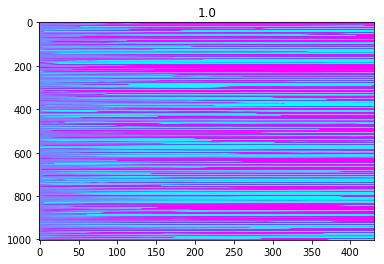

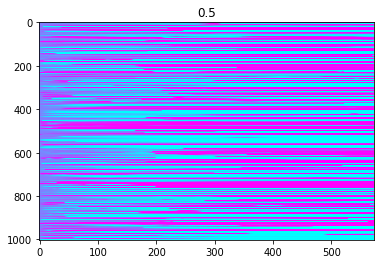

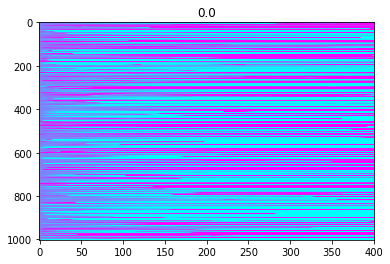

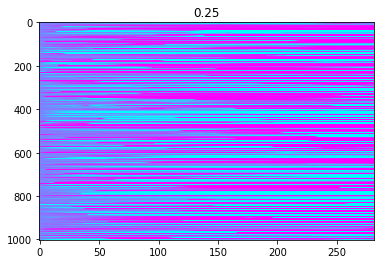

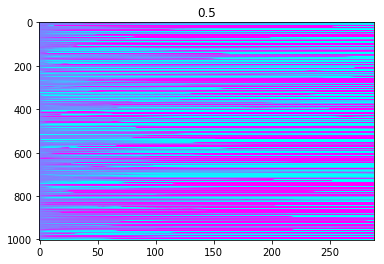

...

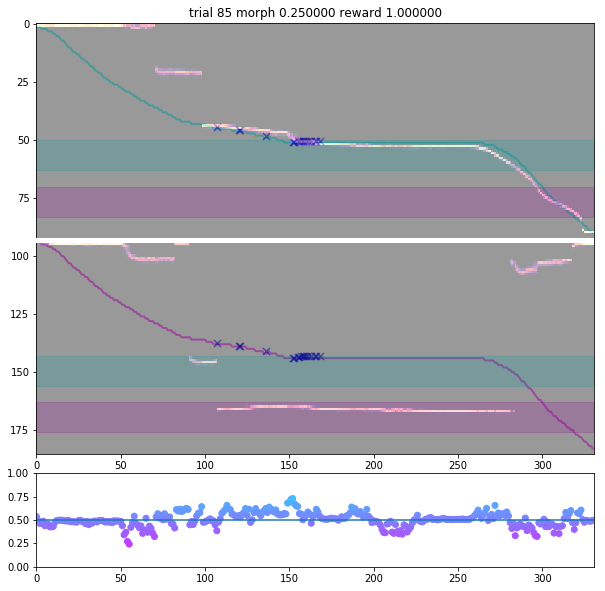

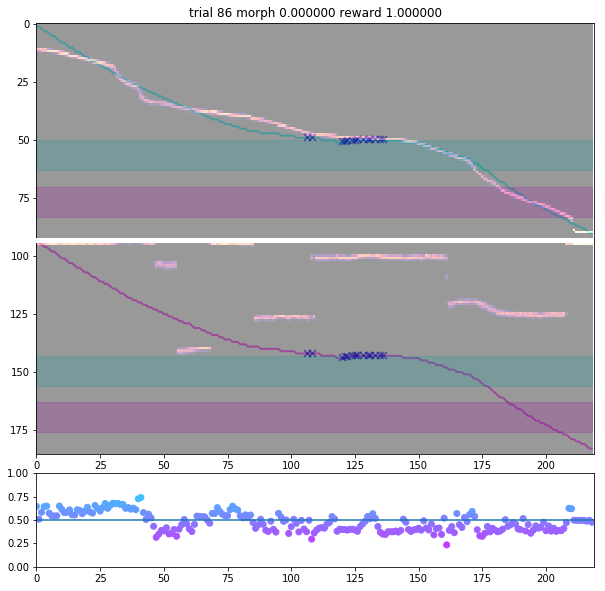

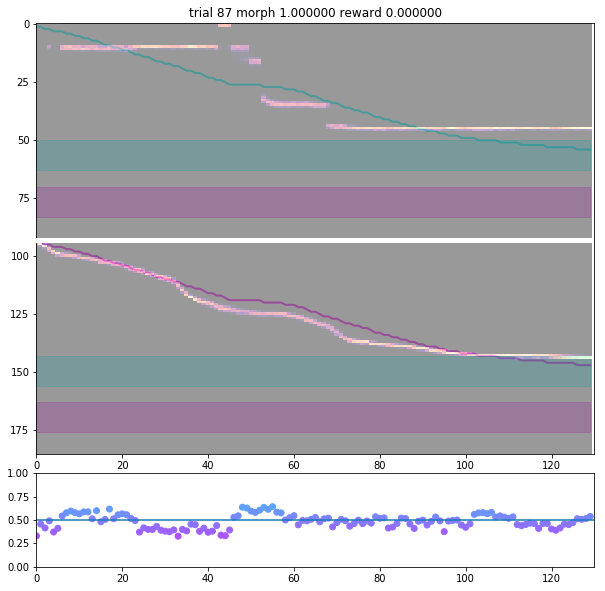

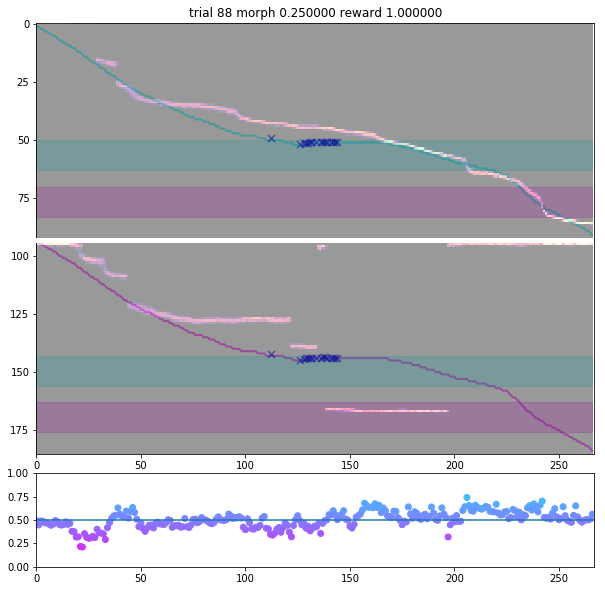

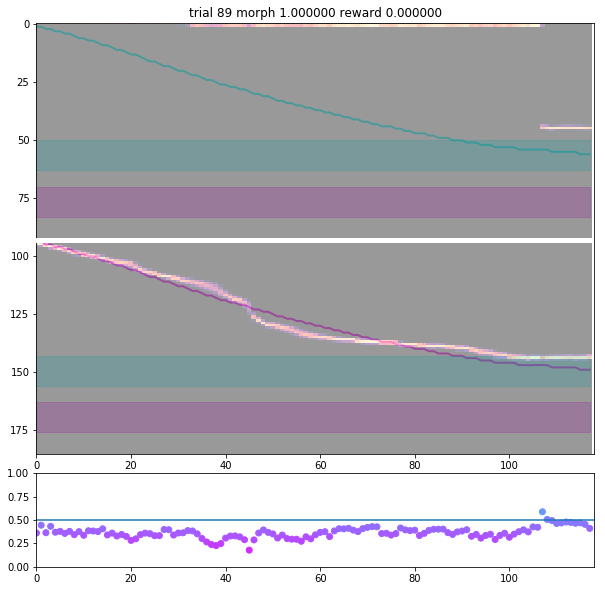

In [25]:
decode_dict = bd.single_session(df_mouse.iloc[6])